<a href="https://colab.research.google.com/github/aish7iitkgp/OpenCV_task/blob/main/OpenCV_Task.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
from google.colab.patches import cv2_imshow

In [2]:
import numpy as np
import pandas as pd

In [3]:
!apt-get update
!apt-get install -y poppler-utils

Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:4 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:6 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:11 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [1,796 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,346 kB]
Get:13 http://security.ubuntu.com/ubuntu jammy-security/univers

In [4]:
!pip install pdf2image

In [5]:
from pdf2image import convert_from_path
import multiprocessing

def convert_pdf_to_png(pdf_path, output_folder, dpi=200):
    images = convert_from_path(pdf_path, dpi=dpi)
    for i, image in enumerate(images):
        image_path = f"{output_folder}/file_1.png"
        image.save(image_path, 'PNG')
        print(f"Saved: {image_path}")

if __name__ == "__main__":
    pdf_path = '/content/drive/MyDrive/opencv/file_1.pdf'
    output_folder = '/content/drive/MyDrive/opencv'

    # Adjust the DPI as needed to balance quality and performance
    convert_pdf_to_png(pdf_path, output_folder, dpi=200)


Saved: /content/drive/MyDrive/opencv/file_1.png


In [6]:
from pdf2image import convert_from_path
import multiprocessing

def convert_pdf_to_png(pdf_path, output_folder, dpi=200):
    images = convert_from_path(pdf_path, dpi=dpi)
    for i, image in enumerate(images):
        image_path = f"{output_folder}/file_2.png"
        image.save(image_path, 'PNG')
        print(f"Saved: {image_path}")

if __name__ == "__main__":
    pdf_path = '/content/drive/MyDrive/opencv/file_2.pdf'
    output_folder = '/content/drive/MyDrive/opencv'

    # Adjust the DPI as needed to balance quality and performance
    convert_pdf_to_png(pdf_path, output_folder, dpi=200)

Saved: /content/drive/MyDrive/opencv/file_2.png


In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np

In [14]:
img1 = cv2.imread("/content/drive/MyDrive/opencv/file_1.png")

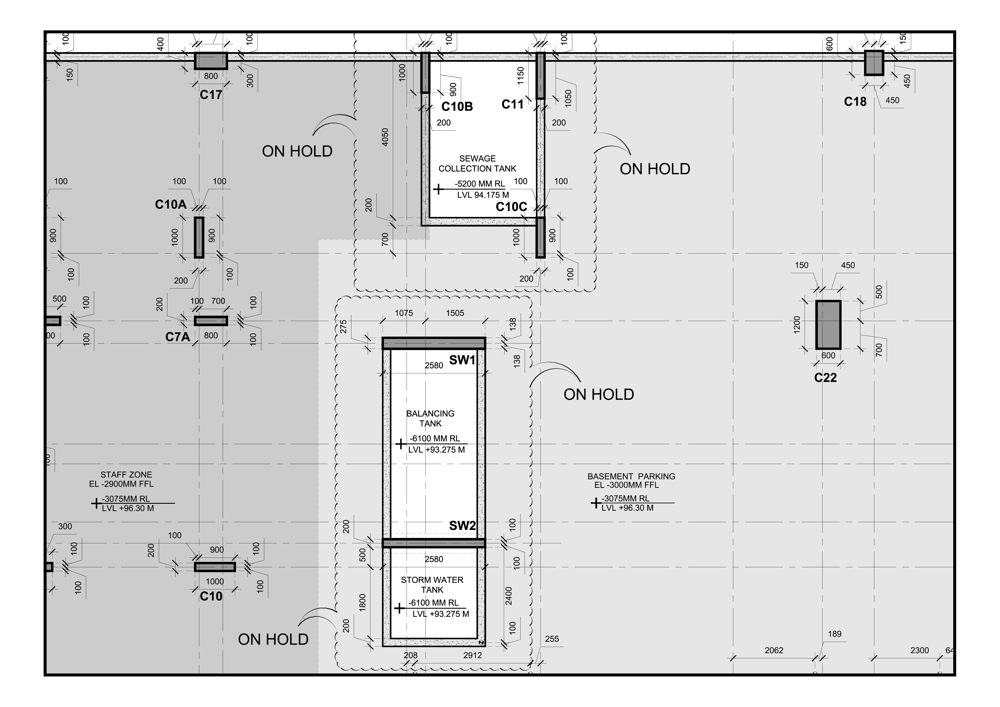

-1

In [15]:
cv2_imshow(img1)
cv2.waitKey(0)

In [12]:
img2 = cv2.imread("/content/drive/MyDrive/opencv/file_2.png")

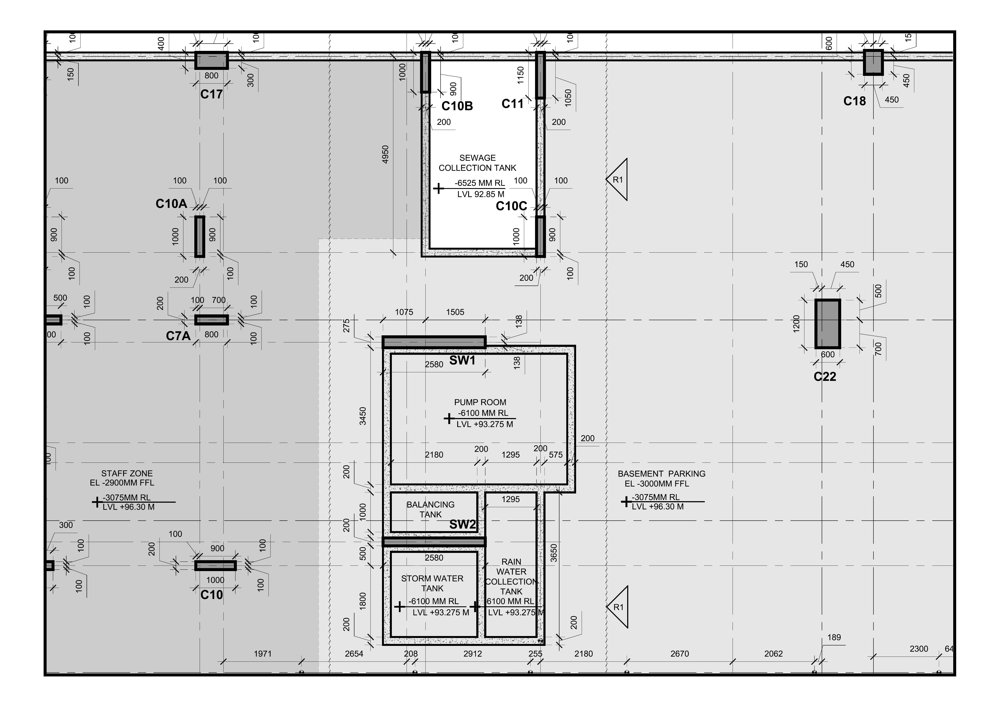

In [13]:
cv2_imshow(img2)

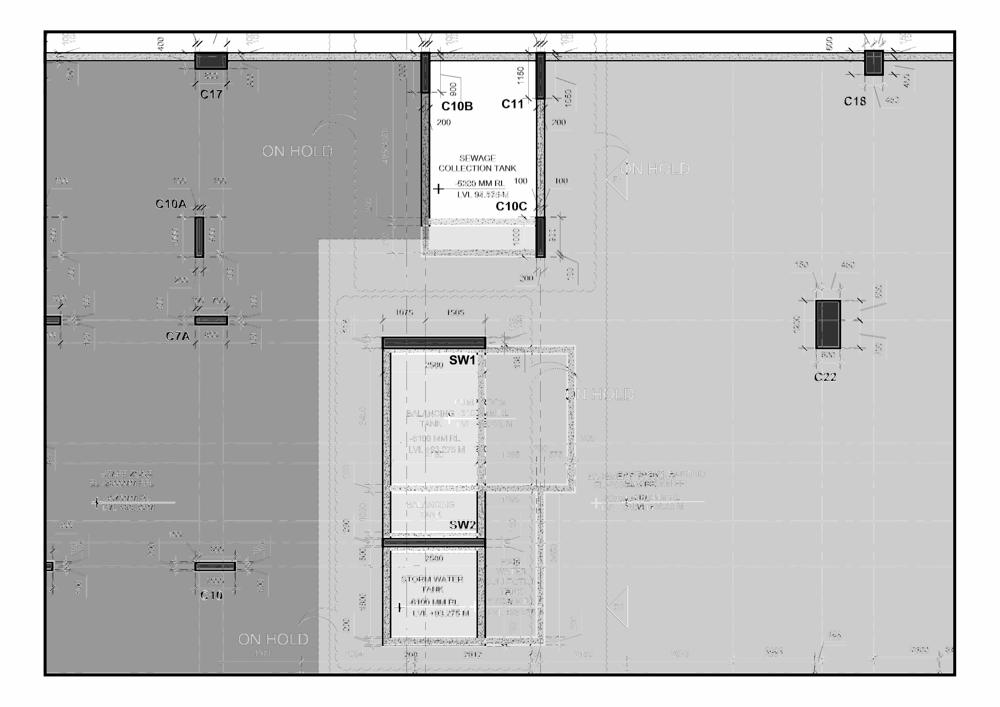

In [16]:

# Add the two images
added_image = img1 + img2

# Display the added image
cv2_imshow(added_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [17]:
# Load the images
image1 = img1
image2 = img2


def convert_to_gray(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

def compute_difference(image1, image2):
    return cv2.absdiff(image1, image2)

def threshold_difference(difference, threshold_value=150, max_value=255):
    _, thresh = cv2.threshold(difference, threshold_value, max_value, cv2.THRESH_BINARY)
    return thresh

def dilate_image(image, kernel_size=(3,3), iterations=1):
    kernel = np.ones(kernel_size, np.uint8)
    return cv2.dilate(image, kernel, iterations=iterations)

def highlight_differences(image, dilated):
    highlighted = image.copy()
    highlighted[dilated == 255] = (0, 0, 255)  # Red color for differences
    return highlighted

def save_image(image, path):
    cv2.imwrite(path, image)
    return path

# Load the images
image1 = img1
image2 = img2

# Convert images to grayscale
gray1 = convert_to_gray(image1)
gray2 = convert_to_gray(image2)

# Compute the absolute difference between the two images
difference = compute_difference(gray1, gray2)

# Threshold the difference to get a binary image of differences
thresh = threshold_difference(difference)

# Dilate the thresholded image to make the differences more visible
dilated = dilate_image(thresh)

# Overlay the differences on the original image
highlighted = highlight_differences(image2, dilated)

# Save the result
result_path = '/content/drive/MyDrive/opencv/differences.png'
save_image(highlighted, result_path)

# Return the path to the saved image
print(result_path)

/content/drive/MyDrive/opencv/differences.png


In [18]:
diff = cv2.imread("/content/drive/MyDrive/opencv/differences.png")

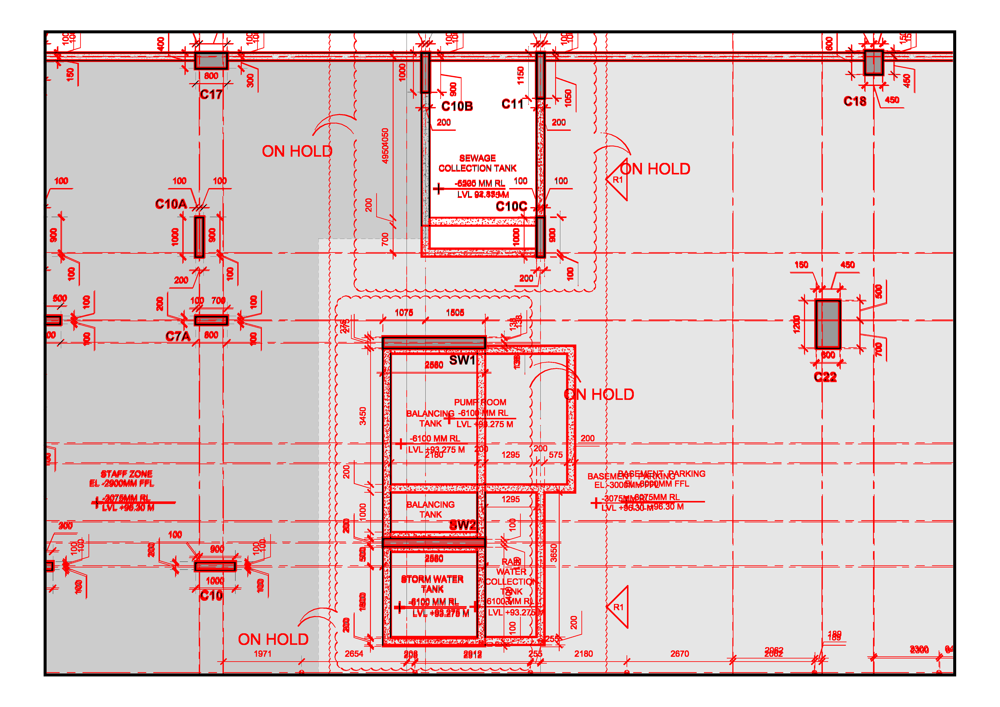

In [19]:
cv2_imshow(diff)

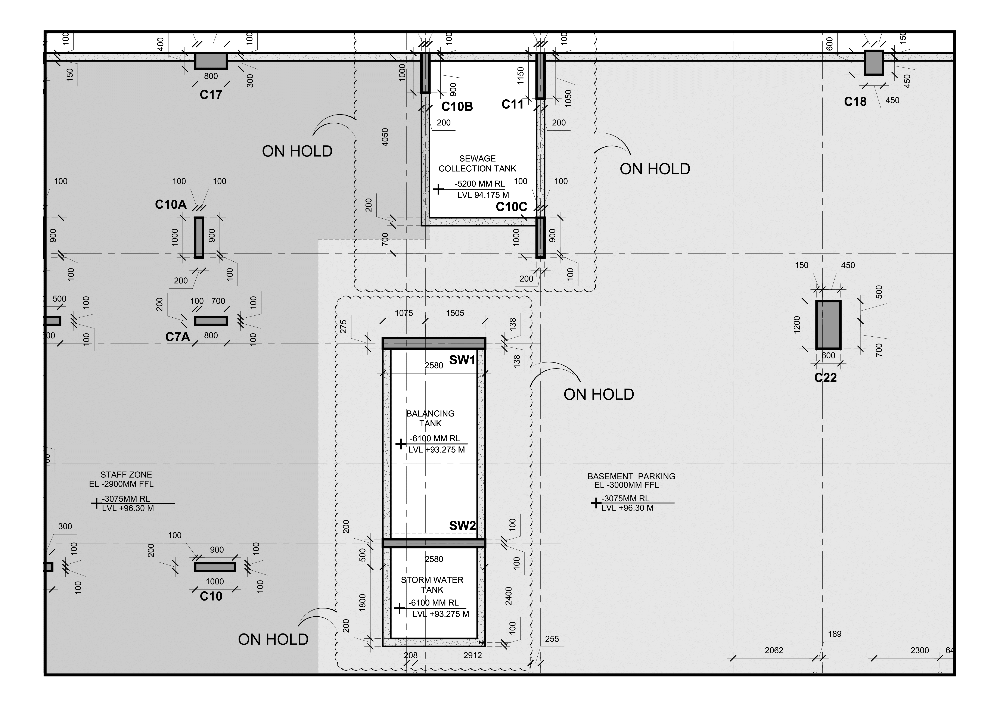

In [20]:
img_int = cv2.imread("/content/drive/MyDrive/opencv/intersecting_regions.png")
cv2_imshow(img_int)

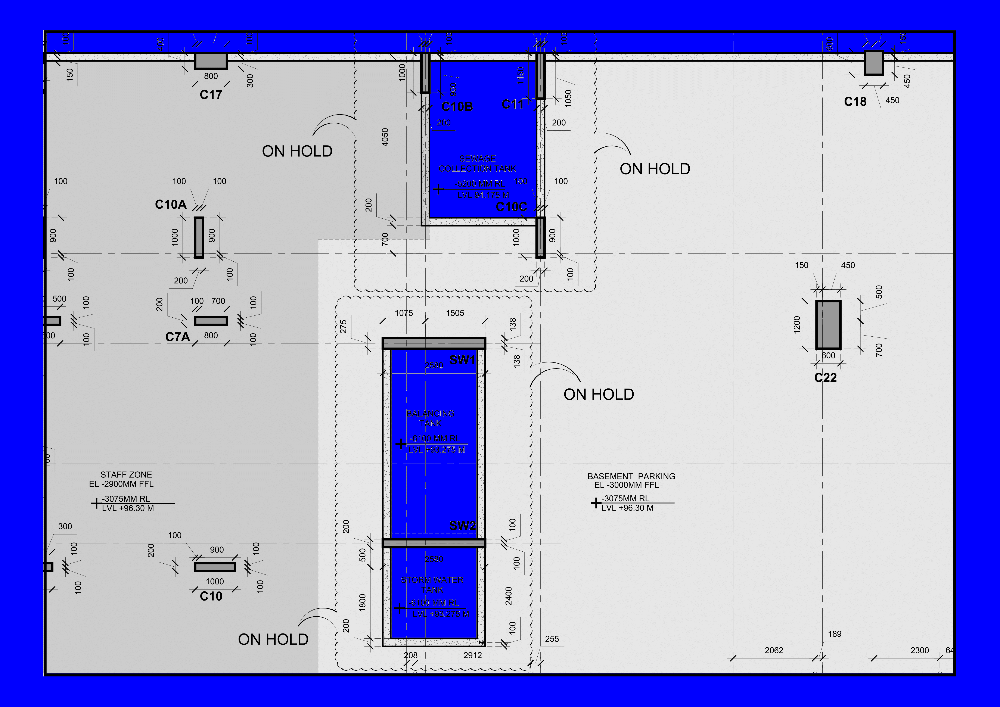

In [21]:
blue_img = cv2.imread("/content/drive/MyDrive/opencv/blue_colored_image.png")
cv2_imshow(blue_img)

In [22]:
import cv2
import numpy as np

# Load the images
image1 = img1
image2 = img2

# Convert images to grayscale
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Compute the absolute difference between the two images
difference = cv2.absdiff(gray1, gray2)

# Threshold the difference to get a binary image of differences
_, thresh = cv2.threshold(difference, 50, 255, cv2.THRESH_BINARY)

# Optionally, dilate the thresholded image to make the differences more visible
kernel = np.ones((4,4), np.uint8)
dilated = cv2.dilate(thresh, kernel, iterations=1)

# Overlay the differences on the original image
highlighted = image2.copy()
highlighted[dilated == 255] = (255, 0, 0)  # Red color for differences
highlighted[gray1 == 0] = (0, 0, 255)       # Blue color for elements present in the first image

# Save the result
result_path = '/content/drive/MyDrive/opencv/differences_highlighted.png'
cv2.imwrite(result_path, highlighted)

# Return the path to the saved image
result_path


'/content/drive/MyDrive/opencv/differences_highlighted.png'

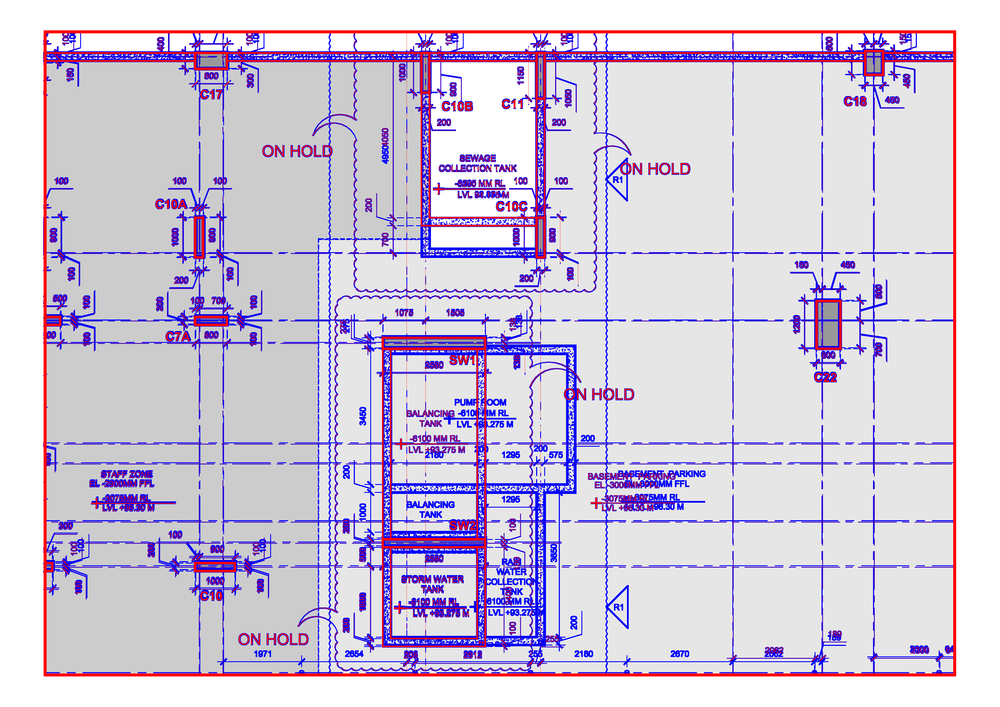

In [23]:
img4 = cv2.imread('/content/drive/MyDrive/opencv/differences_highlighted.png')
cv2_imshow(img4)